# Using Tabula Sapiens as a reference for annotating new datasets

In [1]:
%%capture
# Restart the runtime before running this cell
import numpy as np
import scanpy as sc
import pandas as pd
from scanpy.plotting import palettes
import sys
import os
sys.path.insert(-1, '../..')
import _utils
sys.path.insert(0, '../../PopV')
import popv

2023-03-11 22:31:47.271674: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-11 22:31:47.425094: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-03-11 22:31:48.024183: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:
2023-03-11 22:31:48.024234: W tensorflow/compiler/xla/stream_executor/platf

In [2]:
popv.__file__

'/data/extra_files/galen_dropbox_figures/can_reproducibility/thymus_models/thymus_annotation/../../PopV/popv/__init__.py'

# Step 2: Load your data (User Action Required)
Here we provide three options to load your data:
1. Connect to Google Drive (highly recommended)
2. Download your data from the cloud and save into this session or on Google drive.
3. Upload your data manually into this session (files are not persistent and will be deleted when session is closed)

As an example, we use a subsampled version of the [Lung Cell Atlas](https://hlca.ds.czbiohub.org/) \[1] for our query data.

\[1] Travaglini, K. et al. A molecular cell atlas of the human lung from single-cell RNA sequencing. *Nature* **587**, 619–625(2020).

In [3]:
query_adata = sc.read('thymus_query_construction/Thymus.h5ad')
query_adata.obs_names_make_unique()
query_adata.var_names = query_adata.var_names.str.upper()

# Step 3 (User Action Required): Setting Up Annotation Parameters 

Here is where you set the parameters for the automated annotation.

Arguments:
- **tissue:** Tabula Sapiens tissue to annotate your data with. Available tissues: ["Bladder", "Blood", "Bone_Marrow", "Kidney", "Large_Intestine", "Lung","Lymph_Node", "Pancreas", "Small_Intestine", "Spleen", "Thymus","Trachea", "Vasculature"]
- **save_location:** location to save results to. By default will save to a folder named `annotation_results`. It is highly recommended you provide a Google Drive folder here.
- **query_batch_key:** key in `query_adata.obs` for batch correction. Set to None for no batch correction. 
- **algorithms:** these are the methods to run. By default, will run all methods.
Options: ["knn_on_scvi_pred", "scanvi_pred", "knn_on_bbknn_pred", "svm_pred", "rf_pred", "onclass_pred", "knn_on_scanorama_pred",


Lesser used parameters
- **query_labels_key**: scANVI has the option to use labeled cells in the query dataset during training. To use some prelabeled cells from the query dataset, set `query_labels_key` to the corresponding key in `query_adata.obs`
- **unknown_celltype_label**: If `query_labels_key` is not None, will treat everything not labeled `unknown_celltype_label` as a labeled cell

In [4]:
output_folder = 'annotation'
tissue = 'Thymus'
save_folder = f'{output_folder}/popv_results'

query_batch_key = 'donor_assay'

# Lesser used parameters
query_labels_key=None
unknown_celltype_label='unknown'

# Step 4: Downloading Reference Data and Pretrained Models
No more user input required! Just run all the following code blocks.

**NOTE: PopV has only been evaluated with the Lung/Thymus/Lymph_Node as a reference dataset. Different tissues have different annotation quality and the Tabula sapiens community is currently actively improving the annotation quality. We strongly expect improvement of cell annotation when the updated annotation is released. Upon release the Zenodo repository will be updated.**

In [5]:
# read in the reference dataset
output_fn = '../thymus_cv/data/Thymus_TS.h5ad'
ref_adata = sc.read_h5ad(output_fn)

In [6]:
ref_adata.obs['cell_ontology_class_original'] = ref_adata.obs['cell_ontology_class']

In [7]:
ref_adata.obs['cell_ontology_class'] = ["B cell" if "B cell" in i else i for i in ref_adata.obs['cell_ontology_class']]
ref_adata.obs['cell_ontology_class'] = ["endothelial cell" if "endothelial cell" in i else i for i in ref_adata.obs['cell_ontology_class']]

In [8]:
ref_adata.obs['cell_ontology_class'].value_counts()

CD4-positive helper T cell                   7611
B cell                                       4638
endothelial cell                             4273
fibroblast                                   3924
innate lymphoid cell                         2594
vascular associated smooth muscle cell       2130
DN3 thymocyte                                1788
plasma cell                                  1554
DN1 thymic pro-T cell                         985
naive regulatory T cell                       761
thymocyte                                     553
CD8-positive, alpha-beta cytotoxic T cell     501
macrophage                                    461
monocyte                                      434
T follicular helper cell                      398
CD8-positive, alpha-beta T cell               349
mature NK T cell                              274
medullary thymic epithelial cell              166
fast muscle cell                               86
erythrocyte                                    47


### Setup reference data

In [9]:
# Following parameters are specific to Tabula Sapiens dataset and contain the annotated cell-type and the batch_key that are corrected for during model training.
ref_labels_key='cell_ontology_class'
ref_batch_key = 'donor_assay'

In [10]:
min_celltype_size = np.min(ref_adata.obs.groupby(ref_labels_key).size())
n_samples_per_label = np.max((min_celltype_size, 500))

### Preprocess query with ref dataset


In [11]:
from popv.preprocessing import Process_Query

adata = Process_Query(
        query_adata,
        ref_adata,
        query_labels_key=query_labels_key,
        query_batch_key=query_batch_key,
        ref_labels_key=ref_labels_key,
        ref_batch_key=ref_batch_key,
        unknown_celltype_label=unknown_celltype_label,
        cl_obo_folder='../../PopV/ontology/',
        save_path_trained_models=f'{output_folder}/pretrained_models/',
        prediction_mode='retrain', # 'fast' mode gives fast results (does not include BBKNN and Scanorama and makes more inaccurate errors)
        n_samples_per_label=n_samples_per_label,
        use_gpu=True,
        compute_embedding=True,
        hvg=4000
    ).adata

# Step 5: Run Automated Cell Annotation Methods
No user action required. 

Your results will be saved to the folder you provided as **save_folder**.

All results are stored in adata.obs
- The column `popv_prediction` contains the end popv prediction. 
- `popv_prediction_score` contains the score for the popv_prediction, which is a measure of the number of methods that agreed with the resulting prediction. We use the cell ontology when aggregating results.
- We also include the majority vote, which simply takes the celltype that was most often predicted by the individual methods.

In [12]:
from popv.annotation import annotate_data
annotate_data(adata, save_path=f'{output_folder}/popv_output')

Found 4000 genes among all datasets
[[0.         0.52815247 0.08239782 ... 0.00529348 0.07182032 0.06510851]
 [0.         0.         0.52310504 ... 0.11030671 0.04194587 0.09348915]
 [0.         0.         0.         ... 0.20278686 0.04344041 0.278798  ]
 ...
 [0.         0.         0.         ... 0.         0.22450568 0.28714524]
 [0.         0.         0.         ... 0.         0.         0.81803005]
 [0.         0.         0.         ... 0.         0.         0.        ]]
Processing datasets (24, 25)
Processing datasets (23, 24)
Processing datasets (7, 8)
Processing datasets (26, 27)
Processing datasets (19, 20)
Processing datasets (31, 32)
Processing datasets (12, 14)
Processing datasets (10, 12)
Processing datasets (23, 25)
Processing datasets (16, 18)
Processing datasets (10, 14)
Processing datasets (6, 11)
Processing datasets (11, 15)
Processing datasets (22, 28)
Processing datasets (15, 17)
Processing datasets (4, 5)
Processing datasets (6, 7)
Processing datasets (6, 8)
Process

2023-03-11 23:20:15.994839: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-03-11 23:20:16.075688: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1934] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
2023-03-11 23:20:16.150276: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-03-11 23:20:16.150371: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1934] Cannot dlopen some GPU libraries. Please make sure the 

Training cost after epoch 1: loss:5.362967 acc: 0.964 auc: 1.000 auprc: 0.991
Training cost after epoch 2: loss:2.565973 acc: 0.990 auc: 1.000 auprc: 1.000
Training cost after epoch 3: loss:1.733073 acc: 0.998 auc: 1.000 auprc: 1.000
Training cost after epoch 4: loss:1.267755 acc: 0.997 auc: 1.000 auprc: 1.000
Training cost after epoch 5: loss:0.946001 acc: 0.999 auc: 1.000 auprc: 1.000
Training cost after epoch 6: loss:0.713539 acc: 0.999 auc: 1.000 auprc: 1.000
Training cost after epoch 7: loss:0.548488 acc: 0.999 auc: 1.000 auprc: 1.000
Training cost after epoch 8: loss:0.426829 acc: 0.999 auc: 1.000 auprc: 1.000
Training cost after epoch 9: loss:0.339906 acc: 0.999 auc: 1.000 auprc: 1.000
Training cost after epoch 10: loss:0.278069 acc: 0.999 auc: 1.000 auprc: 1.000
Training cost after epoch 11: loss:0.232845 acc: 0.998 auc: 1.000 auprc: 1.000
Training cost after epoch 12: loss:0.204019 acc: 0.998 auc: 1.000 auprc: 1.000
Training cost after epoch 13: loss:0.183448 acc: 0.998 auc: 1

In [13]:
adata

AnnData object with n_obs × n_vars = 289562 × 4000
    obs: 'tissue_in_publication', 'donor_id', 'free_annotation', 'compartment', 'cell_type_ontology_term_id', 'cell_type', 'assay', 'sex', 'tissue', 'cell_ontology_class', 'cell_ontology_class_tissue', 'donor_tissue', 'assay_correct', 'donor_assay', 'cell_ontology_class_original', '_batch_annotation', '_labels_annotation', '_ref_subsample', 'Sample', 'paper_annotation', 'development_stage', '_dataset', 'n_counts', 'popv_celltypist_prediction', 'popv_celltypist_prediction_probabilities', 'popv_knn_on_bbknn_prediction', 'popv_knn_on_bbknn_prediction_probabilities', 'popv_knn_on_scanorama_prediction', 'popv_knn_on_scanorama_prediction_probabilities', 'subsampled_labels', '_scvi_batch', '_scvi_labels', 'popv_knn_on_scvi_prediction', 'popv_knn_on_scvi_prediction_probabilities', '_labels_annotation_cell_ontology_id', 'popv_onclass_prediction', 'popv_onclass_seen', 'popv_onclass_prediction_probabilities', 'popv_onclass_seen_probabilities', 'p

In [14]:
# Optional: save the full anndata will all objects
adata.write(f'{output_folder}/query_and_reference_popv.h5ad')

# Downstream analysis

In [15]:
import scanpy as sc

In [16]:
output_folder = 'annotation'
adata = sc.read(f'{output_folder}/query_and_reference_popv.h5ad')

In [17]:
adata

AnnData object with n_obs × n_vars = 289562 × 4000
    obs: 'tissue_in_publication', 'donor_id', 'free_annotation', 'compartment', 'cell_type_ontology_term_id', 'cell_type', 'assay', 'sex', 'tissue', 'cell_ontology_class', 'cell_ontology_class_tissue', 'donor_tissue', 'assay_correct', 'donor_assay', 'cell_ontology_class_original', '_batch_annotation', '_labels_annotation', '_ref_subsample', 'Sample', 'paper_annotation', 'development_stage', '_dataset', 'n_counts', 'popv_celltypist_prediction', 'popv_celltypist_prediction_probabilities', 'popv_knn_on_bbknn_prediction', 'popv_knn_on_bbknn_prediction_probabilities', 'popv_knn_on_scanorama_prediction', 'popv_knn_on_scanorama_prediction_probabilities', 'subsampled_labels', '_scvi_batch', '_scvi_labels', 'popv_knn_on_scvi_prediction', 'popv_knn_on_scvi_prediction_probabilities', '_labels_annotation_cell_ontology_id', 'popv_onclass_prediction', 'popv_onclass_seen', 'popv_onclass_prediction_probabilities', 'popv_onclass_seen_probabilities', 'p

In [18]:
adata.obsm['X_umap'] = adata.obsm['X_scanvi_umap_popv']

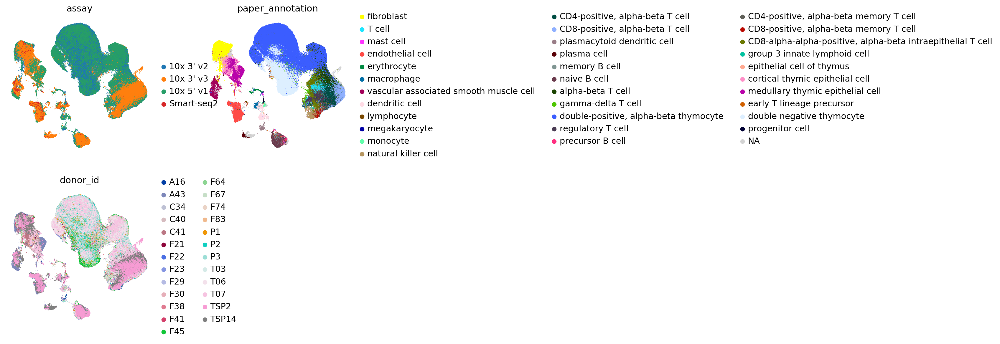

In [19]:
sc.pl.umap(adata, color=['assay', 'paper_annotation', 'donor_id'],
           ncols=2, frameon=False, show=True, size=3)

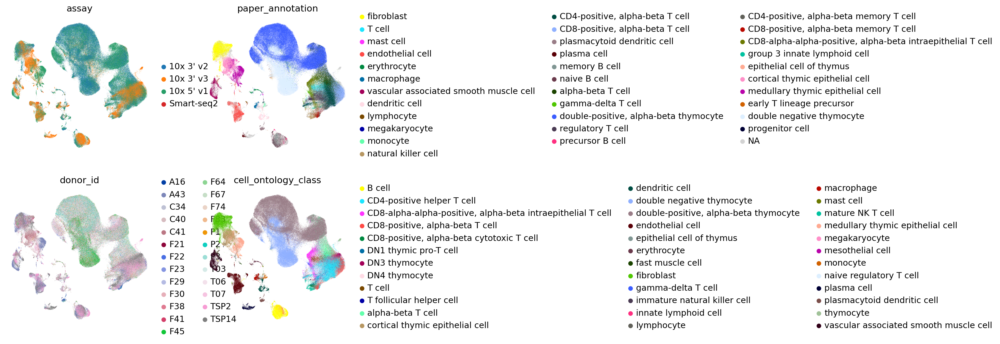

In [20]:
sc.pl.umap(adata, color=['assay', 'paper_annotation', 'donor_id', 'cell_ontology_class'],
           ncols=2, frameon=False, show=True, save='_metadata_integrated.pdf')

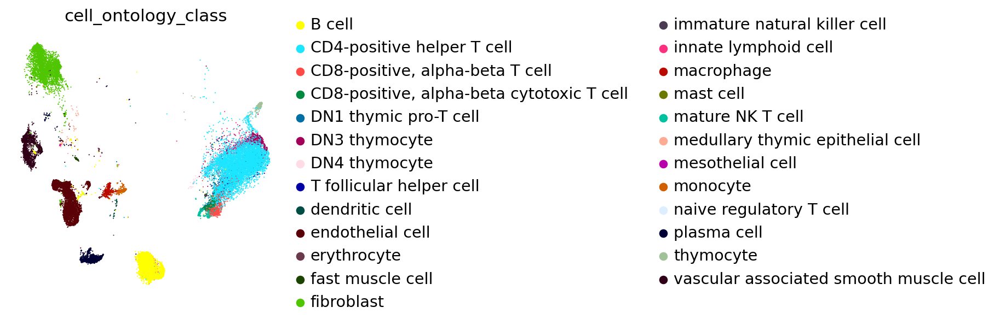

In [21]:
sc.pl.umap(adata[adata.obs['_dataset']=='ref'],
           color=['cell_ontology_class'], ncols=1, frameon=False)

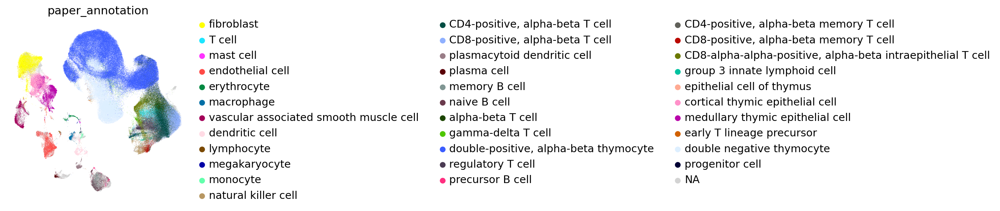

In [22]:
sc.pl.umap(adata,
           color=['paper_annotation'], ncols=1, frameon=False)

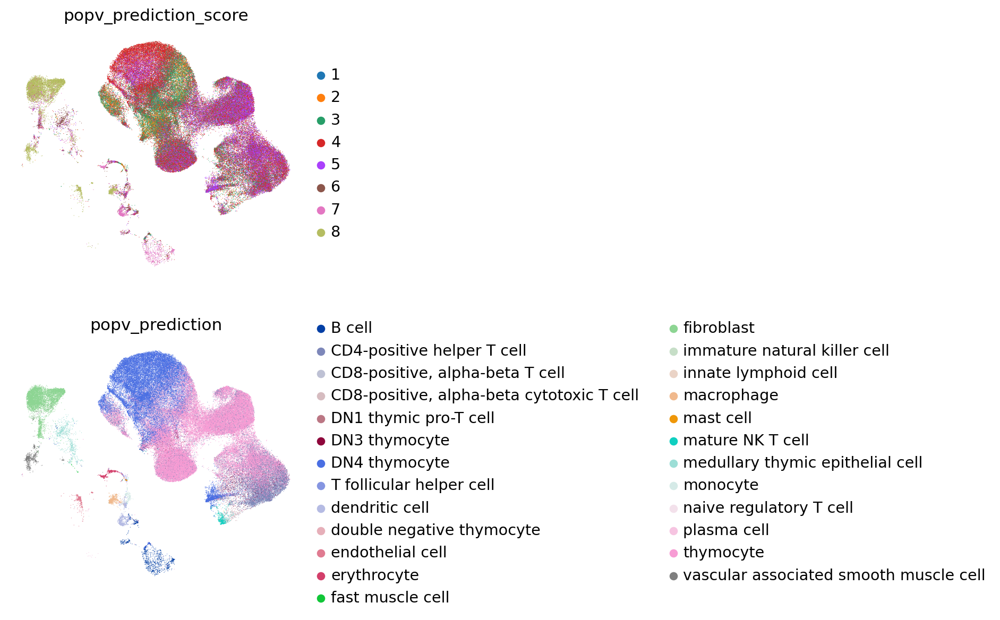

In [23]:
sc.pl.umap(
    adata[[i==True for i in adata.obs['development_stage'].str.contains('th week')]],
    color=['popv_prediction_score', 'popv_prediction'], ncols=1, show=True, save='adult_thymus_predictions.pdf')

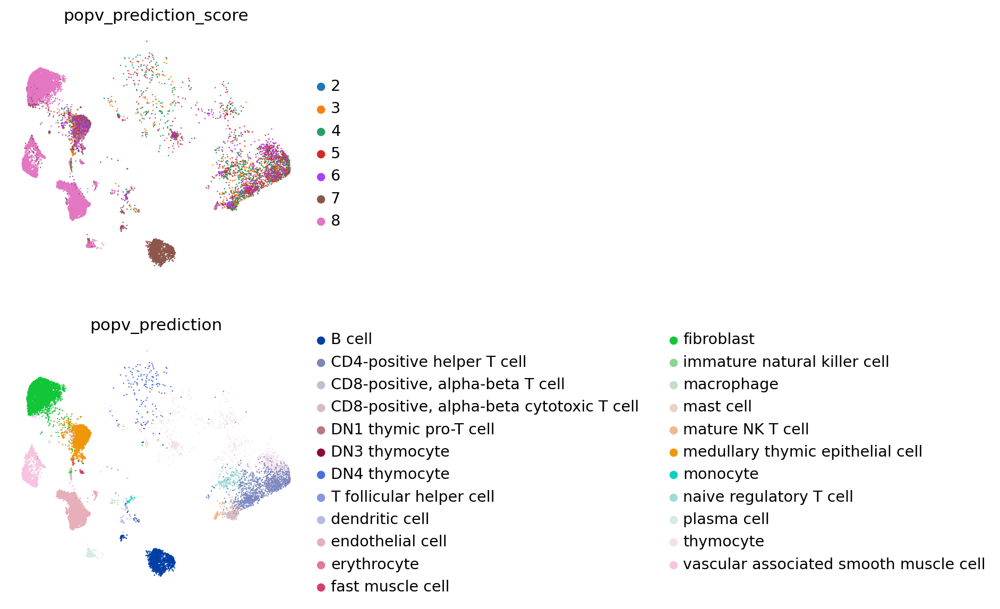

In [24]:
sc.pl.umap(
    adata[adata.obs['development_stage']=='human early adulthood stage'],
    color=['popv_prediction_score', 'popv_prediction'], ncols=1, show=True, save='adult_thymus_predictions.pdf')

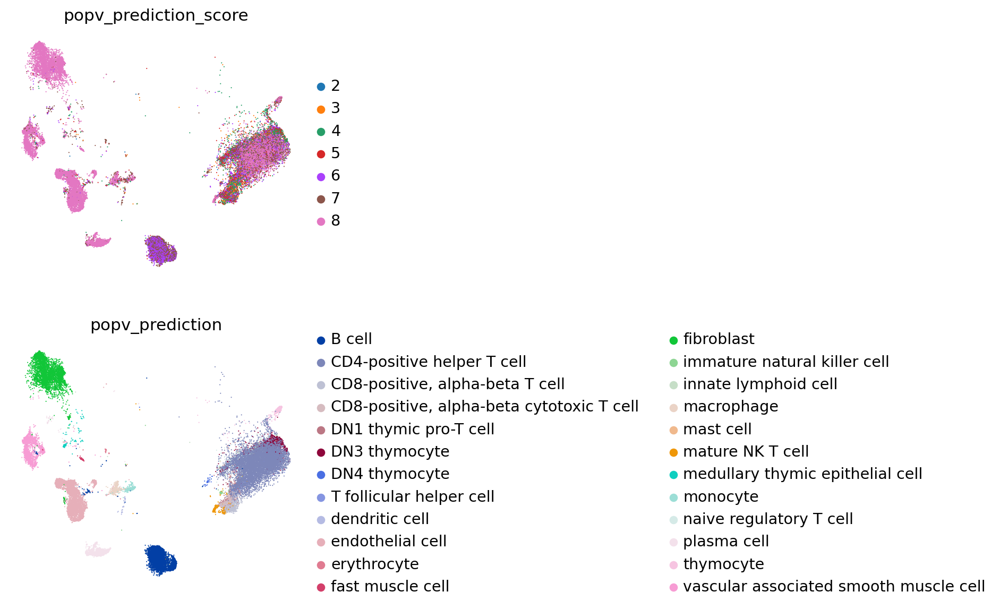

In [25]:
sc.pl.umap(
    adata[adata.obs['_dataset']=='ref'],
    color=['popv_prediction_score', 'popv_prediction'], ncols=1, show=True, save='adult_thymus_predictions.pdf')

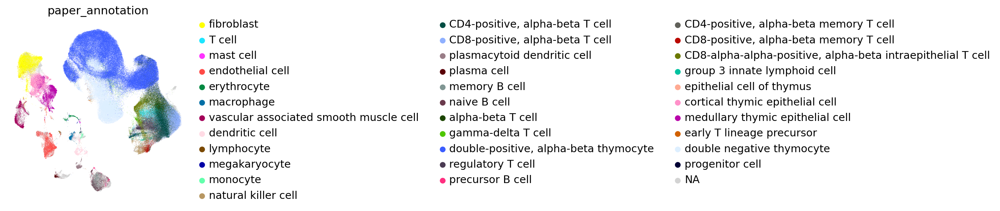

In [26]:
sc.pl.umap(
    adata, color=['paper_annotation'], ncols=1)

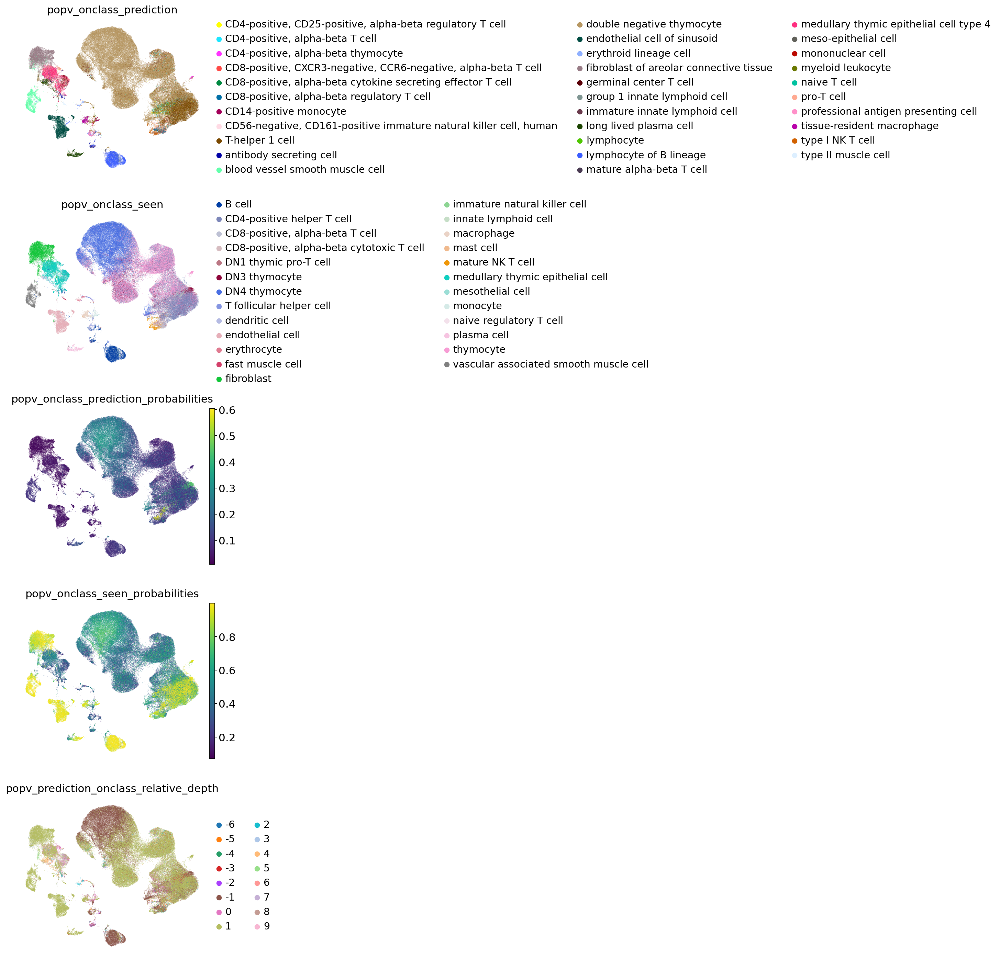

In [27]:
sc.pl.umap(
    adata, color=[i for i in adata.obs if 'onclass' in i], ncols=1)

# Step 6: Summary Statistics

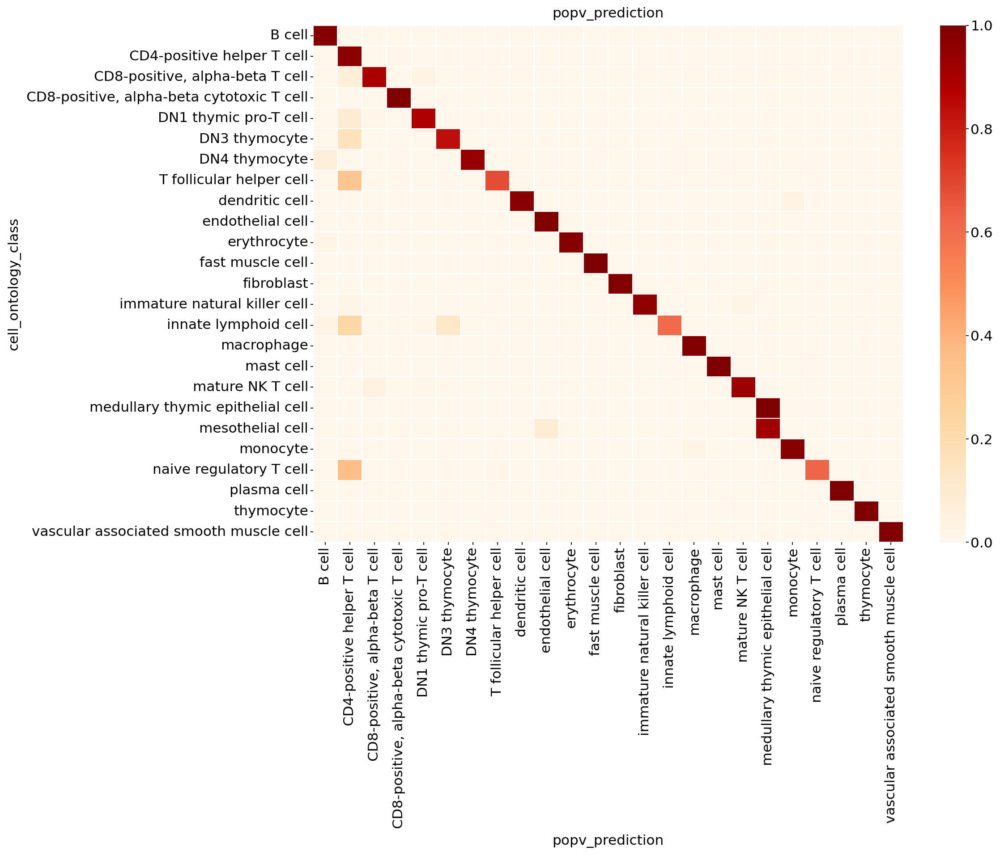

In [28]:
popv.visualization.make_agreement_plots(adata[adata.obs['_dataset']=='ref'], popv_prediction_key='cell_ontology_class', prediction_keys=['popv_prediction'], save_folder=output_folder)

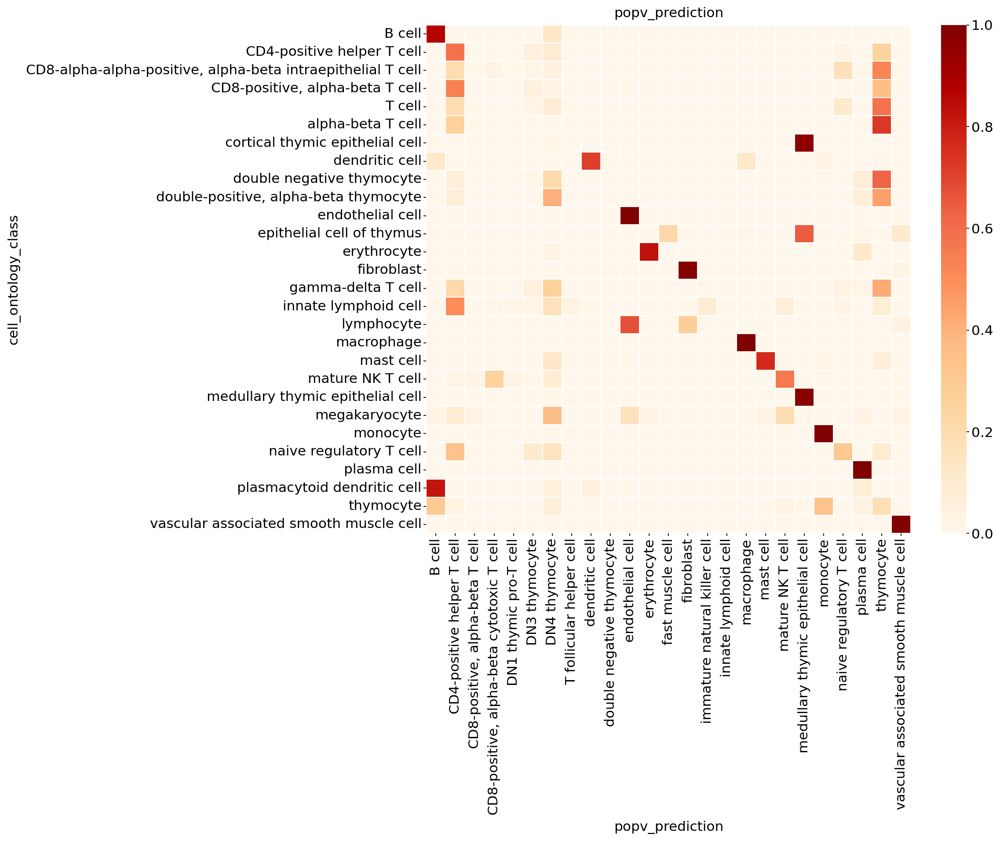

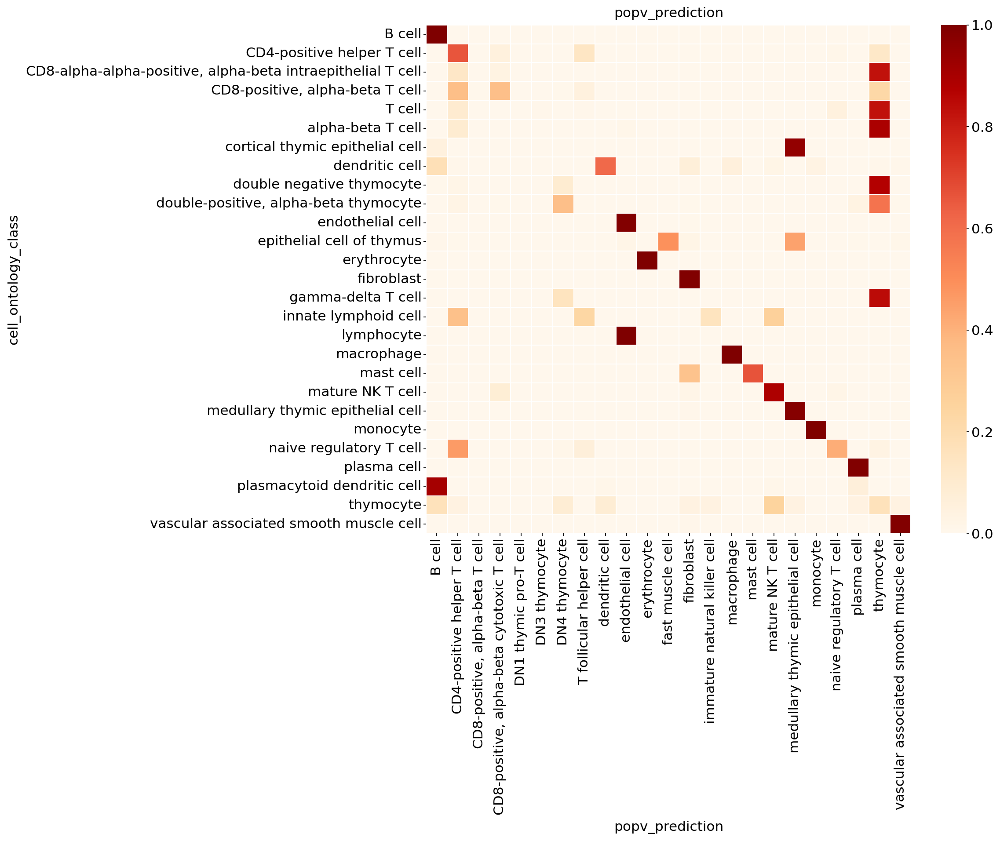

In [29]:
popv.visualization.make_agreement_plots(
    adata[[i==True for i in adata.obs['development_stage'].str.contains('th week')]],
    popv_prediction_key='cell_ontology_class',
    prediction_keys=['popv_prediction'], save_folder=output_folder)
popv.visualization.make_agreement_plots(
    adata[adata.obs['development_stage']=='human early adulthood stage'],
    popv_prediction_key='cell_ontology_class',
    prediction_keys=['popv_prediction'], save_folder=output_folder)

<AxesSubplot:title={'center':'PopV Prediction Score'}, xlabel='Score', ylabel='Frequency'>

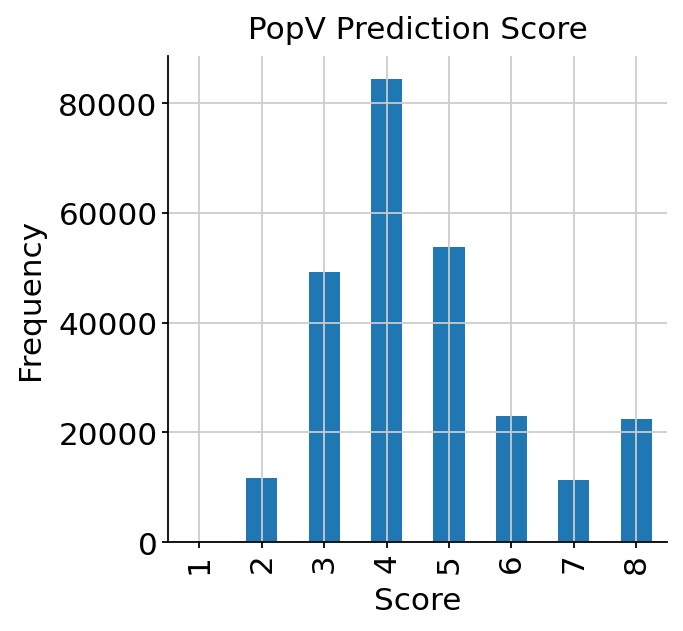

In [30]:
popv.visualization.prediction_score_bar_plot(adata, popv_prediction_score="popv_prediction_score")

<AxesSubplot:ylabel='Mean Agreement'>

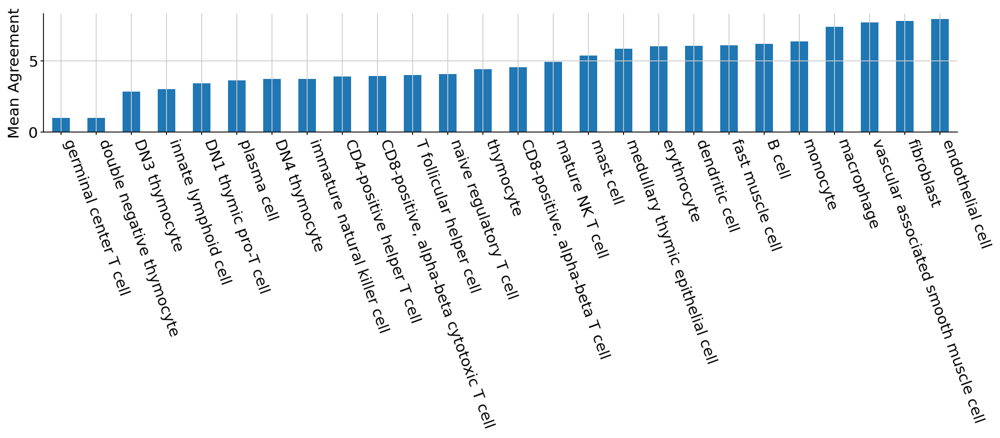

In [31]:
popv.visualization.agreement_score_bar_plot(adata)

### Cell type proportion plot

<AxesSubplot:ylabel='log Celltype Abundance'>

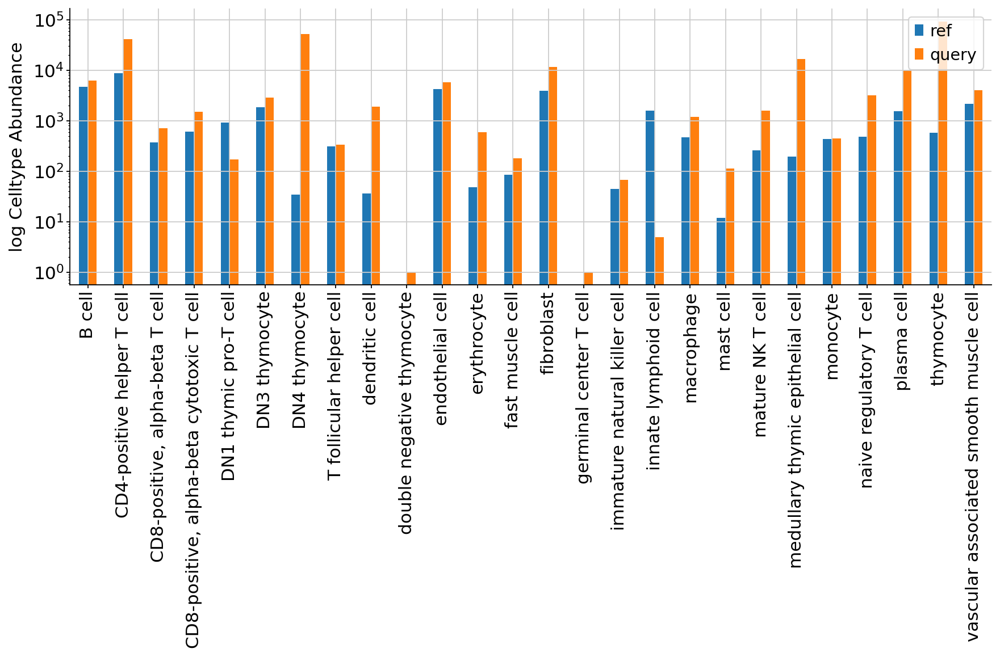

In [32]:
popv.visualization.celltype_ratio_bar_plot(adata)